In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge,Lasso,ElasticNet,RidgeCV,LassoCV,ElasticNetCV,logistic
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import accuracy_score,confusion_matrix,roc_auc_score,roc_curve
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
import seaborn as sns
import pickle
import os
import glob

/home/aditya/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.linear_model.logistic module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.linear_model. Anything that cannot be imported from sklearn.linear_model is now part of the private API.
  warnings.warn(message, FutureWarning)


In [2]:
folder=os.listdir("AReM/")

In [3]:
#to remove the unwanted lines
for i in folder:
    
    myfiles=glob.glob('AReM/{}/*.csv'.format(i))
    for file in myfiles:
        lines = open(file).readlines()
        open(file, 'w').writelines(lines[4:])


In [4]:
try:
    for i in os.listdir("AReM/"):
        for j in os.listdir("AReM/{}".format(i)):
            df=pd.read_csv("AReM/{}/{}".format(i,j),error_bad_lines=False)
            df['label']=i
            df.to_csv("AReM/{}/{}".format(i,j),sep=",")
        
        
except:
    print("Error to add label column")
   

b'Skipping line 481: expected 7 fields, saw 8\n'
b'Skipping line 481: expected 7 fields, saw 8\n'


In [6]:
try:
    folder=os.listdir("AReM/")
    csvfile=[]
    for i in folder:
        myfiles=glob.glob('AReM/{}/*.csv'.format(i))
        for j in myfiles:
            csvfile.append(j)
        

    

    df=pd.concat(map(pd.read_csv,csvfile),ignore_index=True)
    df.to_csv("totaldata.csv",sep=",")


except:
    print("Error in marge")

In [2]:
df=pd.read_csv("totaldata.csv")

In [3]:
df

,Unnamed: 0,Unnamed: 0.1,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,label
0,0,0,0,39.50,0.50,12.00,0.00,0.00,0.00,lying
1,1,1,250,39.75,0.83,13.00,0.00,0.00,0.00,lying
2,2,2,500,40.00,1.00,12.67,0.47,0.00,0.00,lying
3,3,3,750,40.00,0.71,12.50,0.50,1.00,0.00,lying
4,4,4,1000,40.00,0.82,12.50,0.87,1.50,0.50,lying
...,...,...,...,...,...,...,...,...,...,...
42232,42232,475,118750,44.60,0.49,13.75,1.30,22.60,1.02,sitting
42233,42233,476,119000,44.50,0.50,16.50,1.50,22.00,1.22,sitting
42234,42234,477,119250,44.00,0.82,22.75,1.09,20.33,0.94,sitting
42235,42235,478,119500,43.25,0.83,21.75,0.83,20.00,1.22,sitting


In [4]:
df.head()

,Unnamed: 0,Unnamed: 0.1,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,label
0,0,0,0,39.50,0.50,12.00,0.00,0.0,0.0,lying
1,1,1,250,39.75,0.83,13.00,0.00,0.0,0.0,lying
2,2,2,500,40.00,1.00,12.67,0.47,0.0,0.0,lying
3,3,3,750,40.00,0.71,12.50,0.50,1.0,0.0,lying
4,4,4,1000,40.00,0.82,12.50,0.87,1.5,0.5,lying


In [5]:
df.tail()

,Unnamed: 0,Unnamed: 0.1,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,label
42232,42232,475,118750,44.60,0.49,13.75,1.30,22.60,1.02,sitting
42233,42233,476,119000,44.50,0.50,16.50,1.50,22.00,1.22,sitting
42234,42234,477,119250,44.00,0.82,22.75,1.09,20.33,0.94,sitting
42235,42235,478,119500,43.25,0.83,21.75,0.83,20.00,1.22,sitting
42236,42236,479,119750,42.20,0.40,18.00,1.41,16.80,1.17,sitting


In [6]:
df=df.drop(columns=["Unnamed: 0.1"])

In [7]:
df

,Unnamed: 0,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,label
0,0,0,39.50,0.50,12.00,0.00,0.00,0.00,lying
1,1,250,39.75,0.83,13.00,0.00,0.00,0.00,lying
2,2,500,40.00,1.00,12.67,0.47,0.00,0.00,lying
3,3,750,40.00,0.71,12.50,0.50,1.00,0.00,lying
4,4,1000,40.00,0.82,12.50,0.87,1.50,0.50,lying
...,...,...,...,...,...,...,...,...,...
42232,42232,118750,44.60,0.49,13.75,1.30,22.60,1.02,sitting
42233,42233,119000,44.50,0.50,16.50,1.50,22.00,1.22,sitting
42234,42234,119250,44.00,0.82,22.75,1.09,20.33,0.94,sitting
42235,42235,119500,43.25,0.83,21.75,0.83,20.00,1.22,sitting


In [8]:
df.describe()

,Unnamed: 0,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
count,42237.000000,41757.000000,41757.000000,41757.000000,41757.000000,41757.000000,41757.000000
mean,21118.000000,39.021258,1.472967,14.348149,1.513225,16.010977,1.631255
std,12192.915997,6.297586,2.055456,5.414405,1.644267,6.768380,1.642690
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,10559.000000,35.250000,0.430000,11.500000,0.430000,12.000000,0.470000
50%,21118.000000,40.000000,0.500000,15.000000,0.830000,15.750000,1.000000
75%,31677.000000,44.000000,1.870000,18.000000,2.350000,19.250000,2.360000
max,42236.000000,56.250000,17.240000,35.000000,11.420000,40.330000,13.610000


In [9]:
pf=ProfileReport(df)

In [10]:
pf.to_widgets()

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [19]:
pf

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
df['avg_rss12']=df['avg_rss12'].fillna(df['avg_rss12'].mean())

In [12]:
df['var_rss12']=df['var_rss12'].fillna(df['var_rss12'].mean())

In [13]:
df['avg_rss13']=df['avg_rss13'].fillna(df['avg_rss13'].mean())

In [14]:
df['var_rss13']=df['var_rss13'].fillna(df['var_rss13'].mean())


In [15]:
df['var_rss13']=df['var_rss13'].fillna(df['var_rss13'].mean())


In [16]:
df['var_rss13']=df['var_rss13'].fillna(df['var_rss13'].mean())


In [17]:
df['avg_rss23']=df['avg_rss23'].fillna(df['avg_rss23'].mean())


In [18]:
df['var_rss23']=df['var_rss23'].fillna(df['var_rss23'].mean())


In [20]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [21]:
df['avg_rss12']=df['avg_rss12'].replace(0,df['avg_rss12'].mean())

In [22]:
df['var_rss12']=df['var_rss12'].replace(0,df['var_rss12'].mean())

In [23]:
df['avg_rss13']=df['avg_rss13'].replace(0,df['avg_rss13'].mean())

In [24]:
df['var_rss13']=df['var_rss13'].replace(0,df['var_rss13'].mean())

In [25]:
df['var_rss13']=df['var_rss13'].replace(0,df['var_rss13'].mean())

In [26]:
df['var_rss13']=df['var_rss13'].replace(0,df['var_rss13'].mean())

In [27]:
df['var_rss23']=df['var_rss23'].replace(0,df['var_rss23'].mean())

In [28]:
df['avg_rss23']=df['avg_rss23'].replace(0,df['avg_rss23'].mean())

In [29]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

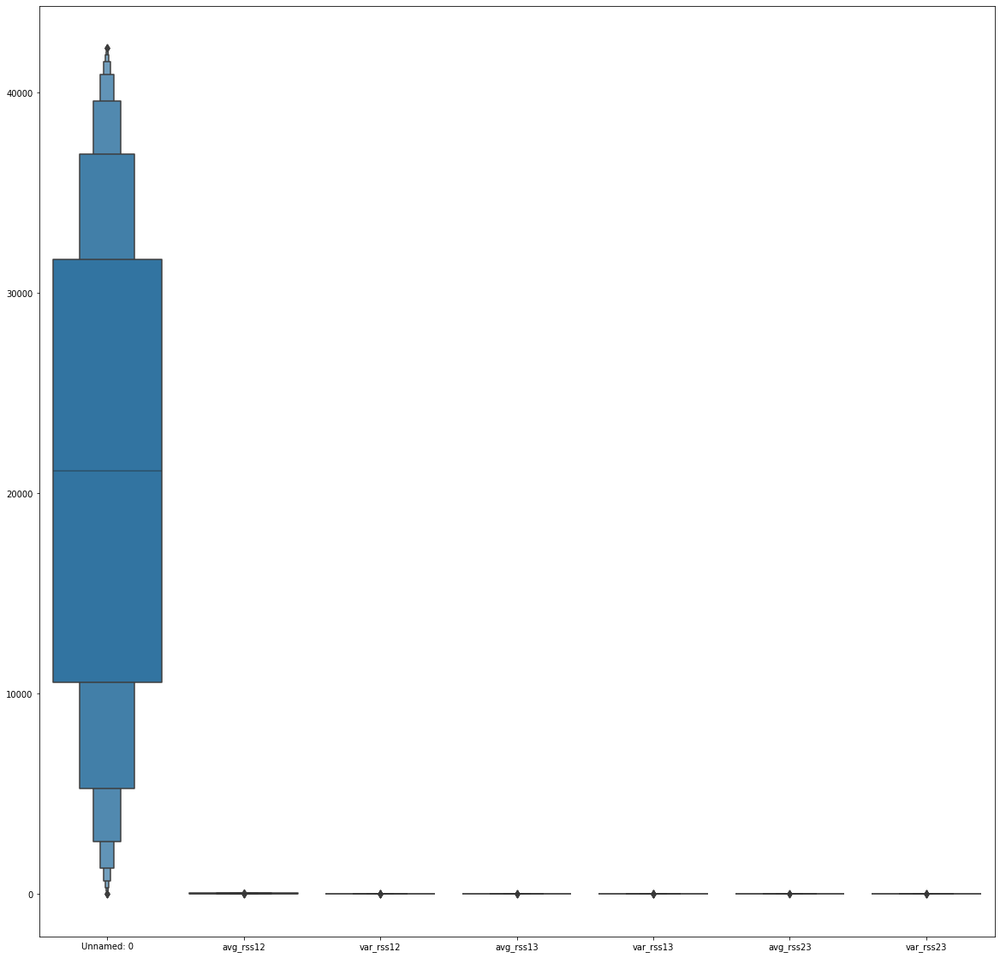

In [30]:
fig,ax=plt.subplots(figsize=(20,20))
sns.boxenplot(data=df,ax=ax)

In [31]:
df.describe()

,Unnamed: 0,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
count,42237.000000,42237.000000,42237.000000,42237.000000,42237.000000,42237.000000,42237.000000
mean,21118.000000,39.023105,1.832098,14.464328,1.808189,16.113707,1.819882
std,12192.915997,6.255938,1.875875,5.225144,1.462711,6.605675,1.524624
min,0.000000,12.500000,0.260000,1.000000,0.240000,1.000000,0.240000
25%,10559.000000,35.250000,0.500000,11.750000,0.710000,12.250000,0.820000
50%,21118.000000,39.750000,1.472967,15.000000,1.513225,16.000000,1.410000
75%,31677.000000,43.750000,1.790000,18.000000,2.290000,19.250000,2.290000
max,42236.000000,56.250000,17.240000,35.000000,11.420000,40.330000,13.610000


In [32]:
df=df.drop(columns=['Unnamed: 0'])

In [33]:
df

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,label
0,0,39.50,0.50,12.00,1.513225,16.010977,1.631255,lying
1,250,39.75,0.83,13.00,1.513225,16.010977,1.631255,lying
2,500,40.00,1.00,12.67,0.470000,16.010977,1.631255,lying
3,750,40.00,0.71,12.50,0.500000,1.000000,1.631255,lying
4,1000,40.00,0.82,12.50,0.870000,1.500000,0.500000,lying
...,...,...,...,...,...,...,...,...
42232,118750,44.60,0.49,13.75,1.300000,22.600000,1.020000,sitting
42233,119000,44.50,0.50,16.50,1.500000,22.000000,1.220000,sitting
42234,119250,44.00,0.82,22.75,1.090000,20.330000,0.940000,sitting
42235,119500,43.25,0.83,21.75,0.830000,20.000000,1.220000,sitting


In [34]:
x=df.drop(columns=['label','# Columns: time'])

In [35]:
x

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
0,39.50,0.50,12.00,1.513225,16.010977,1.631255
1,39.75,0.83,13.00,1.513225,16.010977,1.631255
2,40.00,1.00,12.67,0.470000,16.010977,1.631255
3,40.00,0.71,12.50,0.500000,1.000000,1.631255
4,40.00,0.82,12.50,0.870000,1.500000,0.500000
...,...,...,...,...,...,...
42232,44.60,0.49,13.75,1.300000,22.600000,1.020000
42233,44.50,0.50,16.50,1.500000,22.000000,1.220000
42234,44.00,0.82,22.75,1.090000,20.330000,0.940000
42235,43.25,0.83,21.75,0.830000,20.000000,1.220000


In [36]:
y=df['label']

In [37]:
y

0          lying
1          lying
2          lying
3          lying
4          lying
          ...   
42232    sitting
42233    sitting
42234    sitting
42235    sitting
42236    sitting
Name: label, Length: 42237, dtype: object

In [38]:
x_train,x_test ,y_train,y_test=train_test_split(x,y,test_size=.20,random_state=200)

In [39]:
x_train

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
20348,39.00,1.870000,20.75,3.830000,11.75,2.68
39573,38.00,1.000000,7.50,1.500000,16.50,1.12
30765,41.00,1.220000,15.25,5.070000,14.50,8.38
1401,39.50,0.500000,4.25,0.430000,14.75,0.43
313,39.50,0.500000,2.00,1.513225,12.25,0.43
...,...,...,...,...,...,...
11343,44.50,0.500000,20.00,1.000000,10.00,0.71
41804,41.75,0.430000,11.67,0.470000,4.75,2.59
784,27.00,0.820000,1.00,1.513225,5.50,0.50
12905,43.50,0.500000,12.25,0.430000,16.75,1.09


In [40]:
x_test

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
13465,44.00,0.710000,15.25,0.43,13.75,1.300000
35203,42.00,1.472967,10.67,0.50,13.50,1.120000
21975,34.25,2.380000,16.00,2.45,14.25,6.760000
17779,33.75,9.280000,12.25,2.86,9.50,6.580000
40245,42.67,0.470000,17.50,0.50,13.33,0.470000
...,...,...,...,...,...,...
38133,46.33,0.470000,15.00,0.82,12.00,1.631255
20839,34.00,3.670000,20.50,2.29,13.33,4.110000
18059,41.75,2.590000,9.50,5.22,16.50,2.960000
3901,40.00,1.472967,6.67,0.47,11.50,0.500000


In [41]:
logr = LogisticRegression(multi_class='ovr',solver="saga")

In [42]:
logr.fit(x_train,y_train)

/home/aditya/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/aditya/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/aditya/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/aditya/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/aditya/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_ite

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='ovr', n_jobs=None, penalty='l2',
                   random_state=None, solver='saga', tol=0.0001, verbose=0,
                   warm_start=False)

In [43]:
logr.predict(x_test)

array(['standing', 'lying', 'cycling', ..., 'cycling', 'lying', 'cycling'],
      dtype=object)

In [44]:
y_pred_default = logr.predict(x_test)

In [45]:
y_pred_default

array(['standing', 'lying', 'cycling', ..., 'cycling', 'lying', 'cycling'],
      dtype=object)

In [47]:
confusion_matrix(y_test,y_pred_default)

array([[ 572,    1,   10,    1,   54,   36,    0],
       [  69,  321,   27,   44,  133,    7,    7],
       [   2,   33,  776,    8,  103,   13,  498],
       [   0,   41,    0, 1217,   47,  118,    5],
       [  42,  103,   54,  279,  354,  581,    4],
       [   8,    1,   32,  223,  197,  903,    1],
       [   0,   24,  444,    2,   14,    4, 1035]])